In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/DoAnThiGiac1

/content/drive/MyDrive/DoAnThiGiac1


In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate, AveragePooling2D
import cv2
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from keras.models import Sequential
from keras.callbacks import EarlyStopping,ReduceLROnPlateau,ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import joblib
import glob
from skimage.feature import hog
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
dir_path = '/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train'
root_dir = os.listdir(dir_path)
images = []
labels = []


In [ ]:

for subfolder in root_dir: #biến subfolder chạy trong root_dir
      subfolder_path = os.path.join(dir_path, subfolder) #tạo đường dẫn cho các thư mục con
      print(subfolder_path)
      if not os.path.isdir(subfolder_path) or subfolder =='train' :
          continue
      for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(image_path)
        labels.append(subfolder)
df = pd.DataFrame({'image': images, 'label': labels})
df

/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/0
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/1
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/8
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/5
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/7
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/3
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/6
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/4
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/2
/content/drive/MyDrive/DoAnThiGiac1/SourceCode/train/9


,image,label
0,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,0
1,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,0
2,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,0
3,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,0
4,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,0
...,...,...
11531,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,9
11532,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,9
11533,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,9
11534,/content/drive/MyDrive/DoAnThiGiac1/SourceCode...,9


<ipython-input-17-be9dd1228c04>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=df.label,palette='Set1')


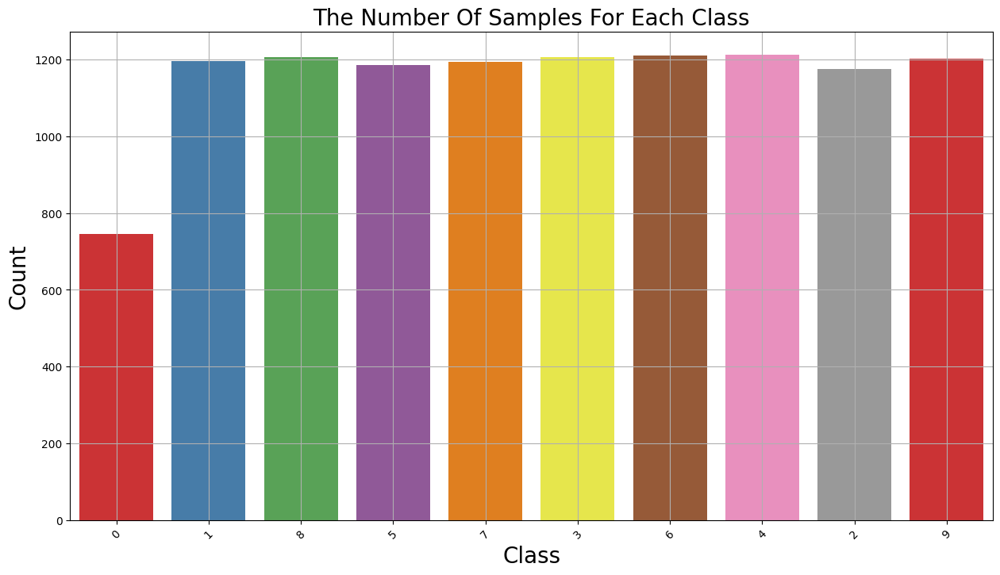

In [ ]:

plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

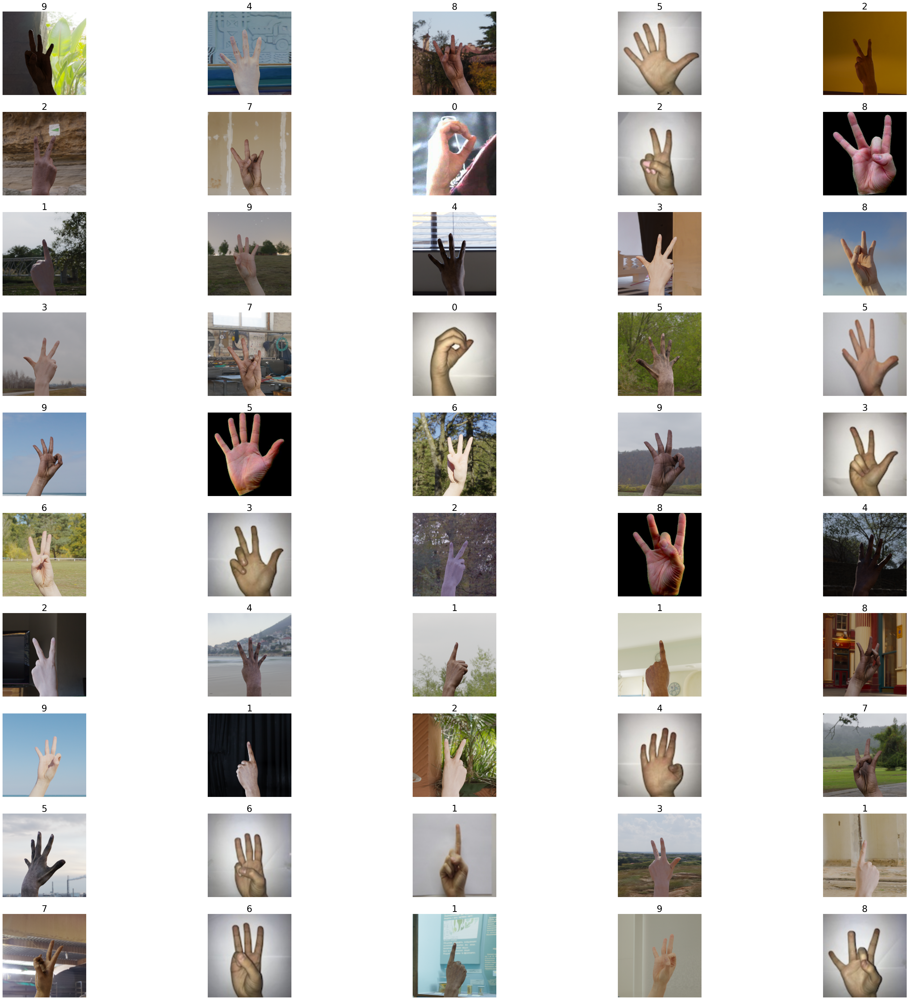

In [ ]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [ ]:
# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)



```
# This is formatted as code
```

# Bộ lọc Sobel + SVM()

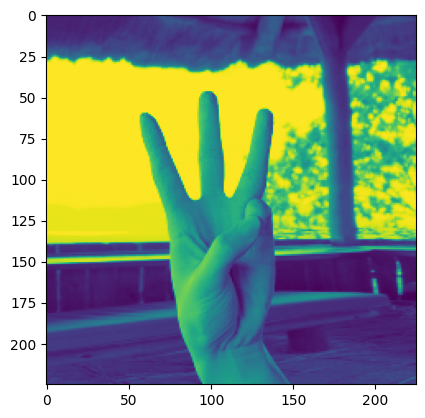

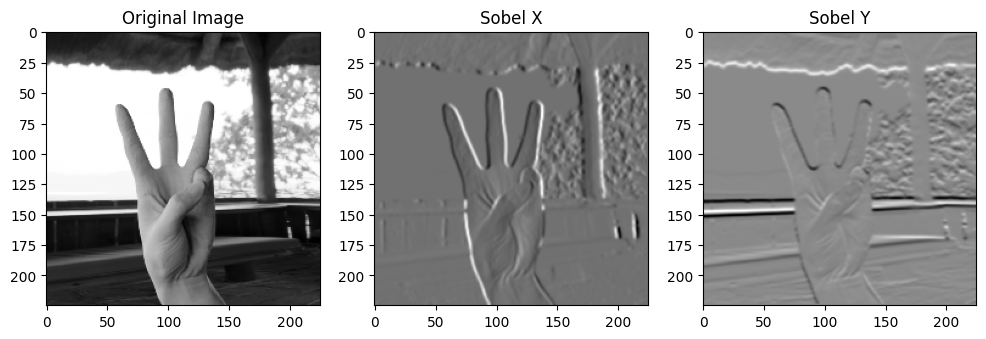

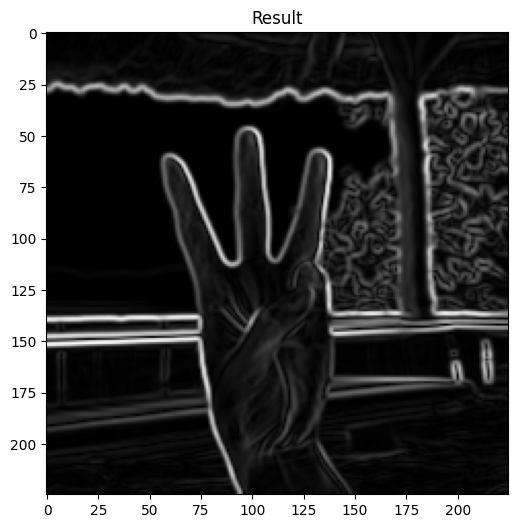

In [ ]:
# Ví dụ về bộ lọc SOBEL
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Đọc ảnh và chuyển sang thang độ xám

img = cv2.imread('/content/drive/MyDrive/DoAnThiGiac1/SourceCode/SDT1/6/so6.png', cv2.IMREAD_GRAYSCALE)

img = cv2.resize(img, (225, 225))
# Áp dụng bộ lọc Sobel theo hướng x và y
sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

# Tính độ lớn gradient
gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)

# Hiển thị kết quả
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Sobel X')
plt.imshow(sobel_x, cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Sobel Y')
plt.imshow(sobel_y, cmap='gray')

plt.figure(figsize=(6, 6))
plt.title('Result')
plt.imshow(gradient_mag, cmap='gray')

plt.show()


In [ ]:
# Function to compute Sobel edge features for an image
def compute_sobel_features(image):
    # Load the image
    img = cv2.imread(image, cv2.IMREAD_GRAYSCALE)

    # Resize the image to a fixed size
    img_resized = cv2.resize(img, (128, 128))  #

    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(img_resized, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(img_resized, cv2.CV_64F, 0, 1, ksize=5)

    # Compute gradient magnitude
    gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)

    return gradient_mag.flatten()


In [ ]:
from concurrent.futures import ThreadPoolExecutor

# Define the number of threads for parallel processing
num_threads = 8  # Adjust as needed

# Initialize ThreadPoolExecutor
with ThreadPoolExecutor(max_workers=num_threads) as executor:
    X_train_sobel = list(executor.map(compute_sobel_features, X_train))

In [ ]:
# Initialize SVM classifier
svm = SVC()


In [ ]:

#TRAIN
svm.fit(X_train_sobel, y_train)


SVC()

In [ ]:
# Extract Sobel edge features for testing images
X_test_sobel = np.array([compute_sobel_features(img) for img in X_test])

# Đánh giá mô hình Sobel + SVM()

              precision    recall  f1-score   support

           0       0.92      0.89      0.90       159
           1       0.90      0.88      0.89       242
           2       0.84      0.80      0.82       246
           3       0.84      0.85      0.85       232
           4       0.77      0.77      0.77       244
           5       0.78      0.83      0.81       216
           6       0.78      0.84      0.81       260
           7       0.86      0.82      0.84       230
           8       0.83      0.80      0.81       254
           9       0.89      0.89      0.89       225

    accuracy                           0.84      2308
   macro avg       0.84      0.84      0.84      2308
weighted avg       0.84      0.84      0.84      2308



Text(0.5, 1.0, 'Accuracy Score: 0.8362218370883883')

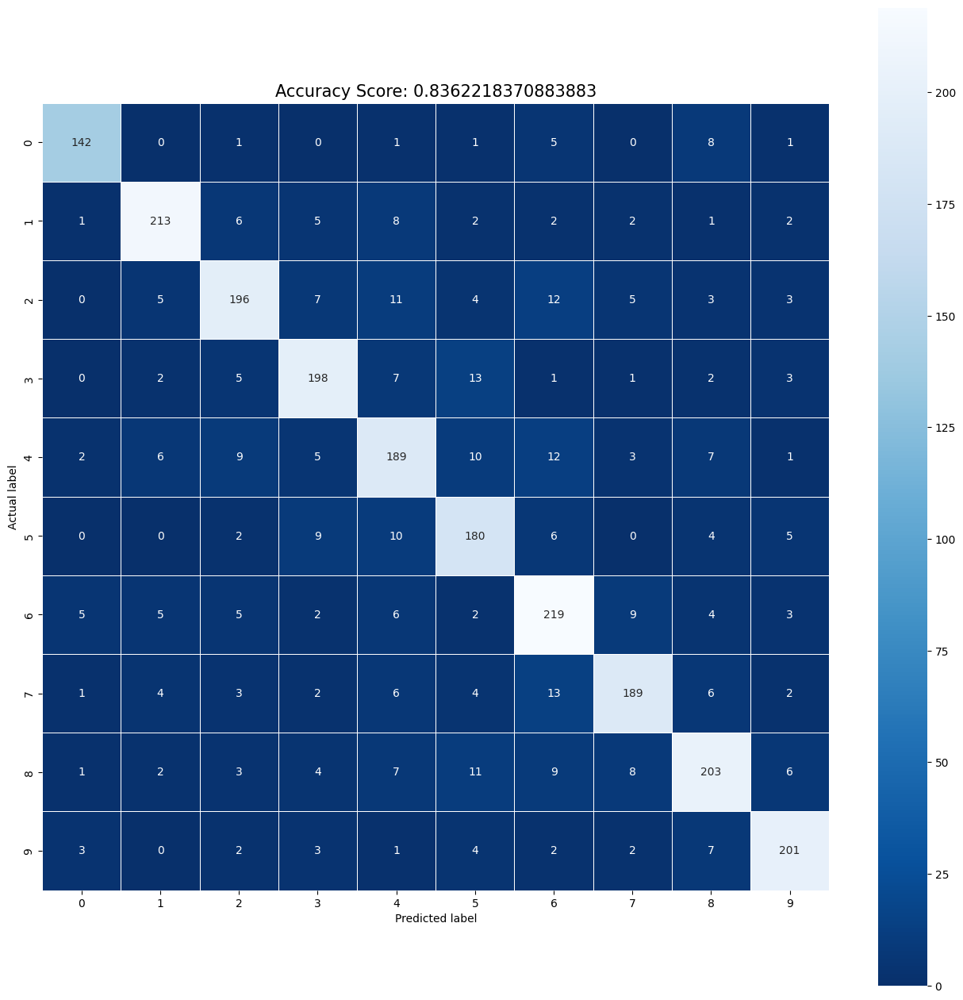

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report


y_pred = svm.predict(X_test_sobel)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

# HOG + SVM()

In [ ]:
images1 = []
labels1 = []
def Tinh_hog(image_path):

    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (100, 100))
    hog_features = hog(img, pixels_per_cell=(16, 16), cells_per_block=(2, 2), visualize=False)
    return hog_features

In [ ]:
for subfolder in root_dir:
    subfolder_path = os.path.join(dir_path, subfolder)
    print(subfolder_path)
    if not os.path.isdir(subfolder_path):
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images1.append(Tinh_hog(image_path))
        labels1.append(subfolder)

/content/drive/MyDrive/DoAnThiGiac1/train/0
/content/drive/MyDrive/DoAnThiGiac1/train/1
/content/drive/MyDrive/DoAnThiGiac1/train/8
/content/drive/MyDrive/DoAnThiGiac1/train/5
/content/drive/MyDrive/DoAnThiGiac1/train/7
/content/drive/MyDrive/DoAnThiGiac1/train/3
/content/drive/MyDrive/DoAnThiGiac1/train/6
/content/drive/MyDrive/DoAnThiGiac1/train/4
/content/drive/MyDrive/DoAnThiGiac1/train/2
/content/drive/MyDrive/DoAnThiGiac1/train/9


In [ ]:
images1 = np.array(images1)
labels1 = np.array(labels1)

In [ ]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(images1, labels1, test_size=0.2, random_state=42)
scaler = MinMaxScaler()
X_train_1 = scaler.fit_transform(X_train_1)
X_test_1 = scaler.transform(X_test_1)

In [ ]:
svm1 = SVC()

In [ ]:


svm1.fit(X_train_1, y_train_1)

SVC()

# Đánh giá mô hình HOG + SVM()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       159
           1       0.86      0.97      0.91       242
           2       0.87      0.87      0.87       246
           3       0.95      0.92      0.93       232
           4       0.94      0.87      0.90       244
           5       0.96      0.96      0.96       216
           6       0.92      0.93      0.93       260
           7       0.89      0.92      0.91       230
           8       0.96      0.87      0.92       254
           9       0.93      0.96      0.94       225

    accuracy                           0.92      2308
   macro avg       0.93      0.93      0.93      2308
weighted avg       0.92      0.92      0.92      2308



Text(0.5, 1.0, 'Accuracy Score : 0.9233102253032929')

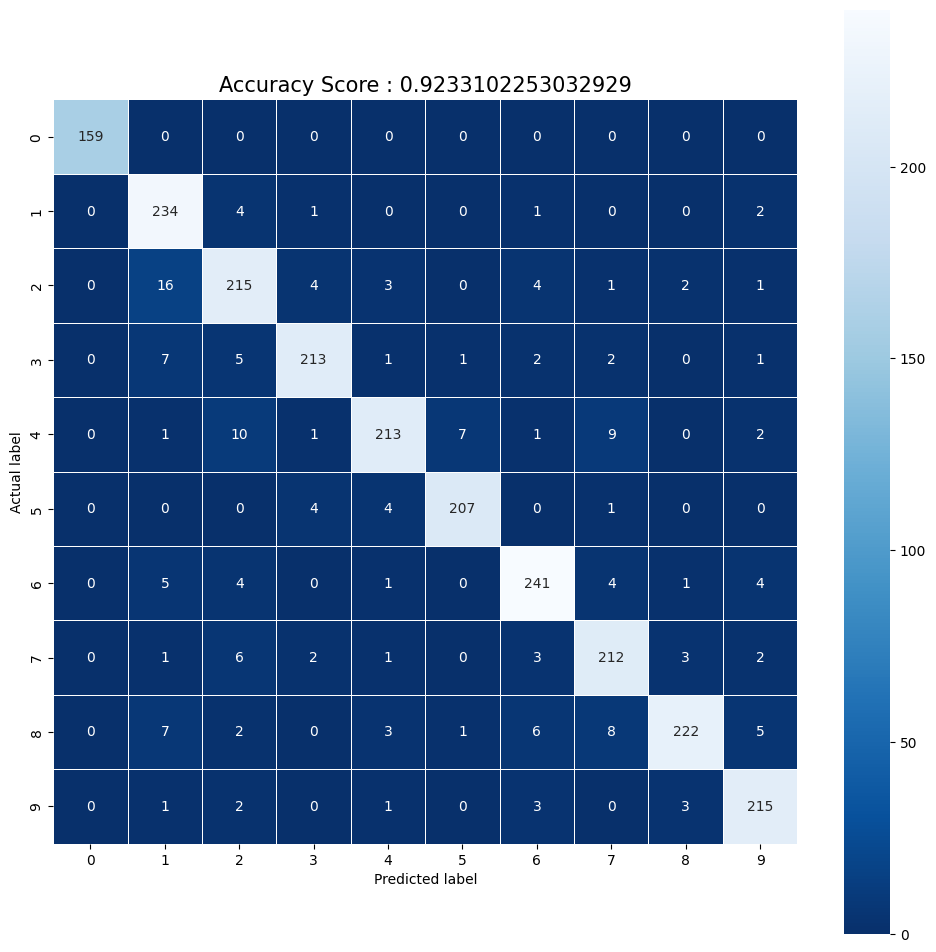

In [ ]:
y_pred_1 = svm1.predict(X_test_1)

print(classification_report(y_test_1, y_pred_1))

cm = confusion_matrix(y_test_1,y_pred_1)
plt.figure(figsize=(12,12))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score : {0}'.format(accuracy_score(y_test_1,y_pred_1))
plt.title(all_sample_title,size=15)

# SOBEL + KNN()

In [ ]:
def compute_sobel_features(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img_resized = cv2.resize(img, (128, 128))
    img_blurred = cv2.GaussianBlur(img_resized, (5, 5), 0)
    sobel_x = cv2.Sobel(img_resized, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(img_resized, cv2.CV_64F, 0, 1, ksize=5)
    gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    return gradient_mag.flatten()

In [ ]:
    for subfolder in root_dir:
      subfolder_path = os.path.join(dir_path, subfolder)
      print(subfolder_path)
      if not os.path.isdir(subfolder_path):
          continue
      for image_filename in os.listdir(subfolder_path):
          image_path = os.path.join(subfolder_path, image_filename)
          images.append(compute_sobel_features(image_path))
          labels.append(subfolder)

/content/drive/MyDrive/DoAnThiGiac1/train/0
/content/drive/MyDrive/DoAnThiGiac1/train/1
/content/drive/MyDrive/DoAnThiGiac1/train/8
/content/drive/MyDrive/DoAnThiGiac1/train/5
/content/drive/MyDrive/DoAnThiGiac1/train/7
/content/drive/MyDrive/DoAnThiGiac1/train/3
/content/drive/MyDrive/DoAnThiGiac1/train/6
/content/drive/MyDrive/DoAnThiGiac1/train/4
/content/drive/MyDrive/DoAnThiGiac1/train/2
/content/drive/MyDrive/DoAnThiGiac1/train/9


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42, shuffle=True, stratify=labels)

In [ ]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#Tìm k tốt nhất

a. Euclidean

In [ ]:
X_kNN_train, X_kNN_validation, y_kNN_train, y_kNN_validation = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_kNN_train = scaler.fit_transform(X_kNN_train)
X_kNN_validation = scaler.transform(X_kNN_validation)
best_accuracy = 0.0
best_k = None

for k in range(1,21):
    knn = KNeighborsClassifier(n_neighbors=k,metric='euclidean')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=1: 0.5719237435008665
Accuracy k=2: 0.5142980935875217
Accuracy k=3: 0.5233968804159446
Accuracy k=4: 0.5259965337954939
Accuracy k=5: 0.5246967071057193
Accuracy k=6: 0.5277296360485269
Accuracy k=7: 0.5277296360485269
Accuracy k=8: 0.5134315424610052
Accuracy k=9: 0.5121317157712305
Accuracy k=10: 0.5181975736568457
Accuracy k=11: 0.520363951473137
Accuracy k=12: 0.5134315424610052
Accuracy k=13: 0.5121317157712305
Accuracy k=14: 0.5194974003466204
Accuracy k=15: 0.5134315424610052
Accuracy k=16: 0.5151646447140381
Accuracy k=17: 0.5099653379549394
Accuracy k=18: 0.5021663778162911
Accuracy k=19: 0.5025996533795494
Accuracy k=20: 0.5034662045060658


Do k = 1 thực sự không ổn khi chỉ xét 1 hàng xóm xung quanh nó, do đó lúc này sẽ lựa chọn k có accuracy lớn thứ 2 là k = 7.

In [ ]:
best_k = 7

In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='euclidean')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=7)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.64      0.74       149
           1       0.36      0.77      0.49       239
           2       0.48      0.52      0.50       235
           3       0.55      0.51      0.53       242
           4       0.40      0.59      0.47       243
           5       0.63      0.39      0.48       237
           6       0.62      0.52      0.57       242
           7       0.69      0.50      0.58       239
           8       0.74      0.40      0.52       241
           9       0.68      0.54      0.60       241

    accuracy                           0.53      2308
   macro avg       0.60      0.54      0.55      2308
weighted avg       0.59      0.53      0.54      2308



Text(0.5, 1.0, 'Accuracy Score: 0.5342287694974004')

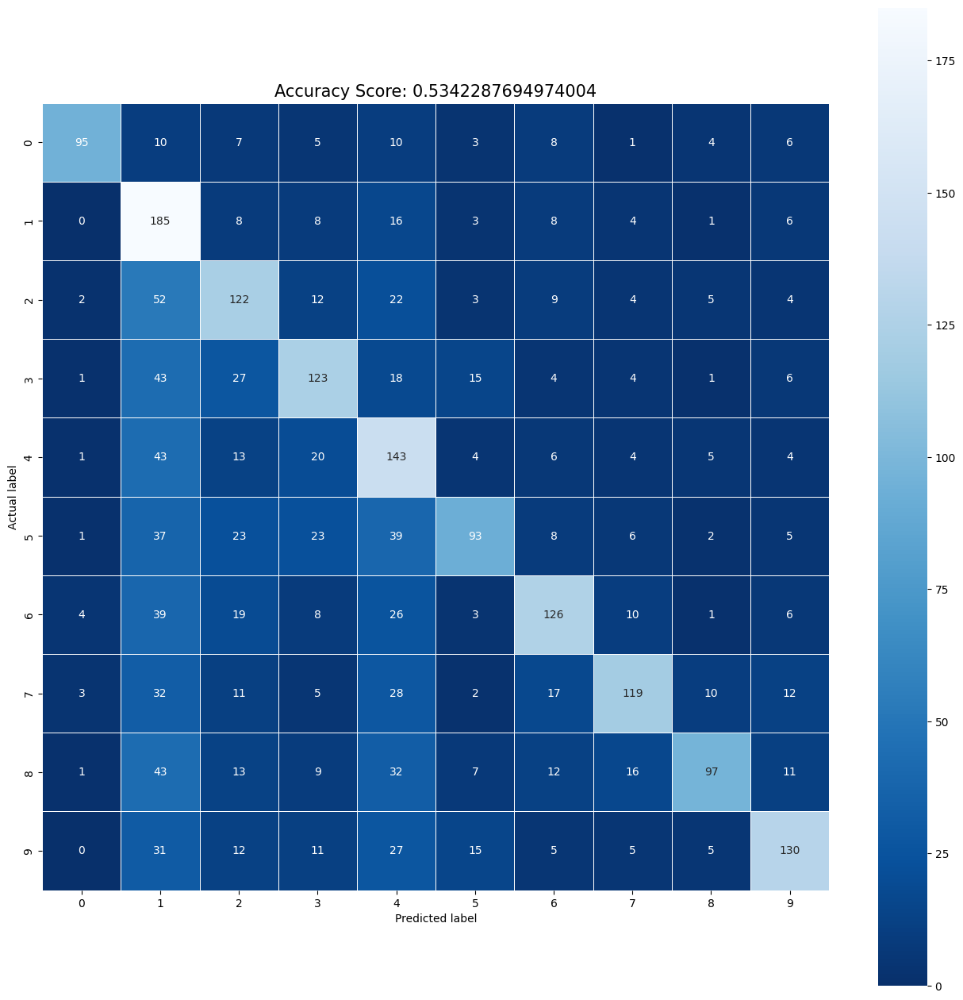

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

b.Cosine

In [ ]:
best_accuracy = 0.0
best_k = None

for k in range(10,26):
    knn = KNeighborsClassifier(n_neighbors=k,metric='cosine')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=10: 0.7049393414211439
Accuracy k=11: 0.7179376083188909
Accuracy k=12: 0.7205372616984402
Accuracy k=13: 0.7144714038128249
Accuracy k=14: 0.7101386481802426
Accuracy k=15: 0.7144714038128249
Accuracy k=16: 0.7123050259965338
Accuracy k=17: 0.7149046793760832
Accuracy k=18: 0.7192374350086655
Accuracy k=19: 0.7214038128249567
Accuracy k=20: 0.7214038128249567
Accuracy k=21: 0.7196707105719238
Accuracy k=22: 0.7205372616984402
Accuracy k=23: 0.7270363951473137
Accuracy k=24: 0.7253032928942807
Accuracy k=25: 0.7227036395147314


In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='cosine')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=23)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.89      0.93       149
           1       0.67      0.81      0.73       239
           2       0.68      0.62      0.65       235
           3       0.75      0.72      0.73       242
           4       0.54      0.73      0.62       243
           5       0.87      0.67      0.75       237
           6       0.64      0.77      0.70       242
           7       0.76      0.74      0.75       239
           8       0.85      0.60      0.71       241
           9       0.81      0.78      0.79       241

    accuracy                           0.73      2308
   macro avg       0.75      0.73      0.74      2308
weighted avg       0.74      0.73      0.73      2308



Text(0.5, 1.0, 'Accuracy Score: 0.7261698440207972')

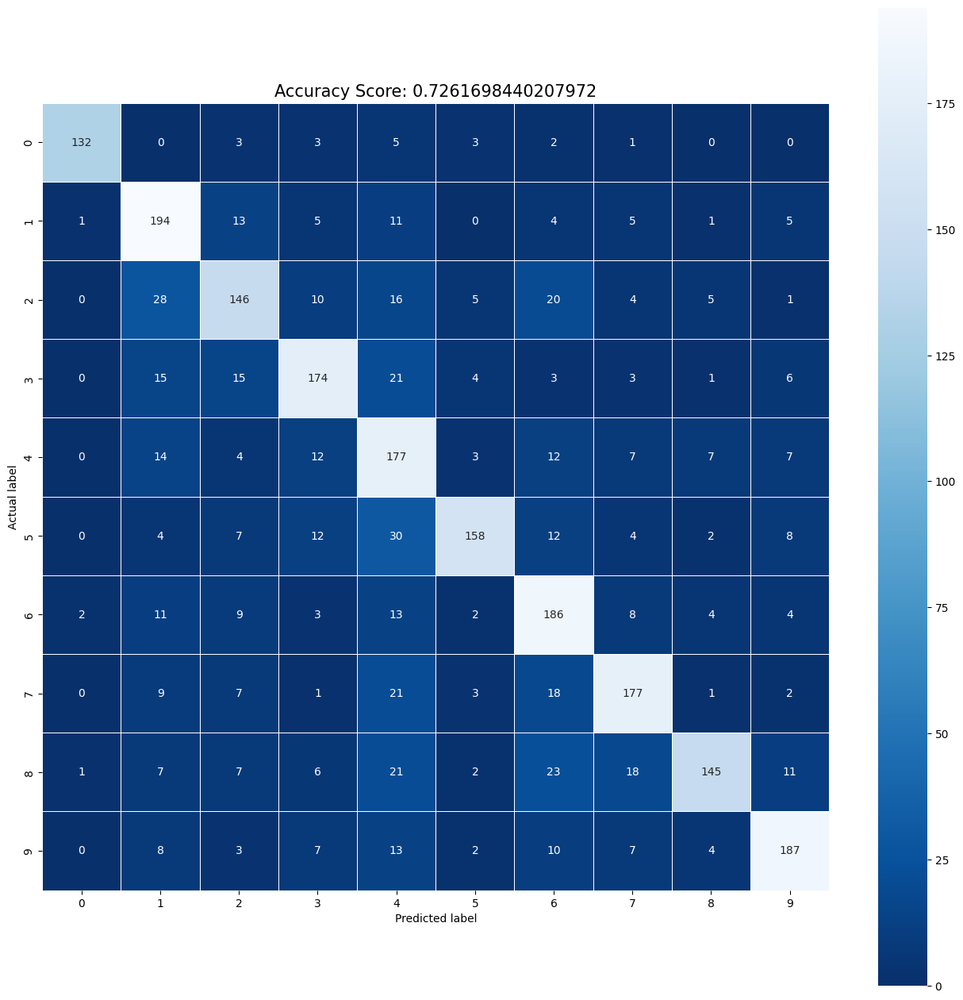

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

c.Correlation

In [ ]:
X_kNN_train, X_kNN_validation, y_kNN_train, y_kNN_validation = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_kNN_train = scaler.fit_transform(X_kNN_train)
X_kNN_validation = scaler.transform(X_kNN_validation)
best_accuracy = 0.0
best_k = None

for k in range(10,21):
    knn = KNeighborsClassifier(n_neighbors=k,metric='correlation')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=10: 0.7651646447140381
Accuracy k=11: 0.7642980935875217
Accuracy k=12: 0.7712305025996534
Accuracy k=13: 0.7725303292894281
Accuracy k=14: 0.7707972270363952
Accuracy k=15: 0.7733968804159446
Accuracy k=16: 0.7746967071057193
Accuracy k=17: 0.7720970537261699
Accuracy k=18: 0.7716637781629117
Accuracy k=19: 0.7738301559792028
Accuracy k=20: 0.7712305025996534


In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='correlation')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='correlation', n_neighbors=16)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.97      0.96       149
           1       0.59      0.78      0.67       239
           2       0.70      0.73      0.71       235
           3       0.68      0.83      0.75       242
           4       0.70      0.69      0.70       243
           5       0.88      0.70      0.78       237
           6       0.74      0.76      0.75       242
           7       0.83      0.73      0.78       239
           8       0.88      0.67      0.76       241
           9       0.88      0.80      0.84       241

    accuracy                           0.76      2308
   macro avg       0.78      0.77      0.77      2308
weighted avg       0.78      0.76      0.76      2308



Text(0.5, 1.0, 'Accuracy Score: 0.761265164644714')

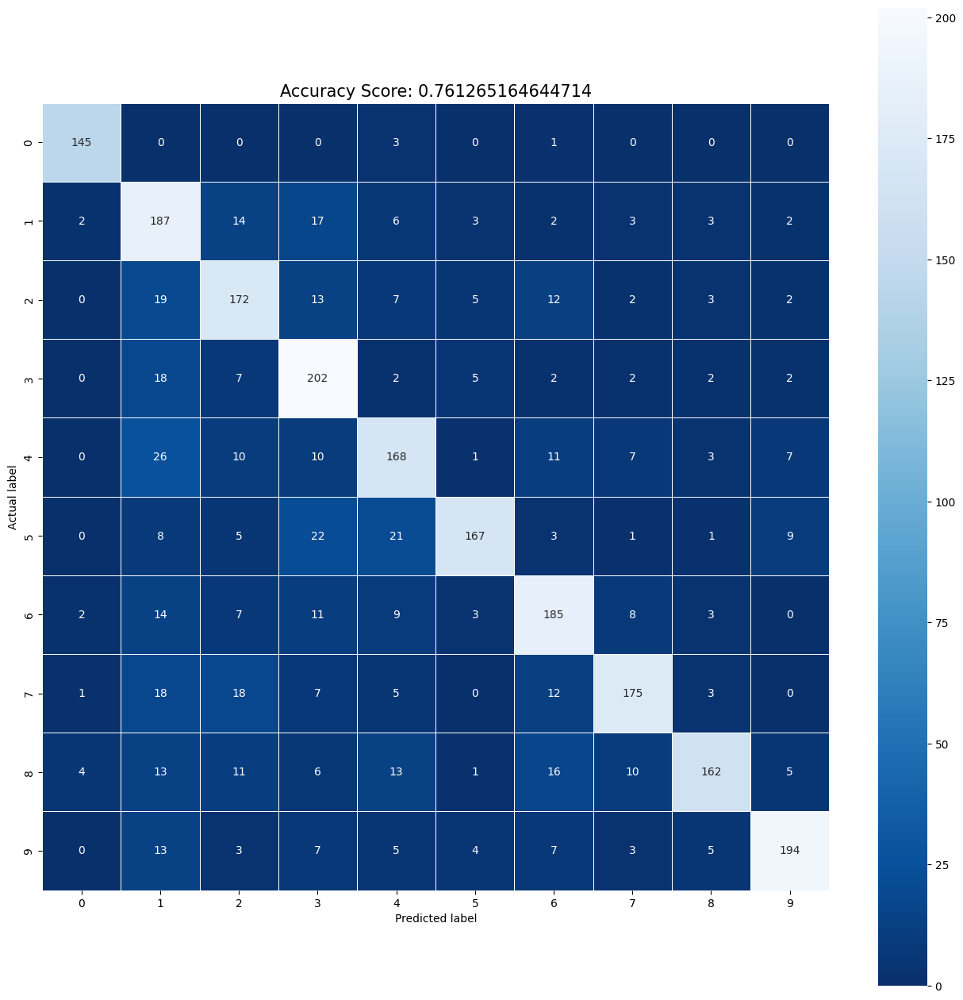

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

# HOG + KNN()




In [ ]:
images = []
labels = []
def Tinh_hog(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (128, 128))
    hog_features = hog(img, pixels_per_cell=(16, 16), cells_per_block=(2, 2), visualize=False)
    return hog_features

In [ ]:
for subfolder in root_dir:
    subfolder_path = os.path.join(dir_path, subfolder)
    print(subfolder_path)
    if not os.path.isdir(subfolder_path):
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(Tinh_hog(image_path))
        labels.append(subfolder)

/content/drive/MyDrive/DoAnThiGiac1/train/0
/content/drive/MyDrive/DoAnThiGiac1/train/1
/content/drive/MyDrive/DoAnThiGiac1/train/8
/content/drive/MyDrive/DoAnThiGiac1/train/5
/content/drive/MyDrive/DoAnThiGiac1/train/7
/content/drive/MyDrive/DoAnThiGiac1/train/3
/content/drive/MyDrive/DoAnThiGiac1/train/6
/content/drive/MyDrive/DoAnThiGiac1/train/4
/content/drive/MyDrive/DoAnThiGiac1/train/2
/content/drive/MyDrive/DoAnThiGiac1/train/9


In [ ]:
images = np.array(images)
labels = np.array(labels)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#Tìm k tốt nhất

a.Euclidean

In [ ]:
X_kNN_train, X_kNN_validation, y_kNN_train, y_kNN_validation = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_kNN_train = scaler.fit_transform(X_kNN_train)
X_kNN_validation = scaler.transform(X_kNN_validation)
best_accuracy = 0.0
best_k = None

for k in range(1,21):
    knn = KNeighborsClassifier(n_neighbors=k,metric='euclidean')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=1: 0.7807625649913345
Accuracy k=2: 0.761265164644714
Accuracy k=3: 0.8032928942807626
Accuracy k=4: 0.8266897746967071
Accuracy k=5: 0.8396880415944541
Accuracy k=6: 0.8474870017331022
Accuracy k=7: 0.8483535528596187
Accuracy k=8: 0.8570190641247833
Accuracy k=9: 0.8661178509532063
Accuracy k=10: 0.871317157712305
Accuracy k=11: 0.8665511265164645
Accuracy k=12: 0.8678509532062392
Accuracy k=13: 0.8687175043327556
Accuracy k=14: 0.8700173310225303
Accuracy k=15: 0.8695840554592721
Accuracy k=16: 0.8669844020797227
Accuracy k=17: 0.8704506065857885
Accuracy k=18: 0.8700173310225303
Accuracy k=19: 0.8678509532062392
Accuracy k=20: 0.8695840554592721


In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='euclidean')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=10)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       149
           1       0.86      0.87      0.86       239
           2       0.76      0.80      0.78       235
           3       0.90      0.88      0.89       242
           4       0.73      0.82      0.77       243
           5       0.92      0.87      0.89       237
           6       0.80      0.84      0.82       242
           7       0.90      0.89      0.89       239
           8       0.89      0.75      0.81       241
           9       0.90      0.90      0.90       241

    accuracy                           0.86      2308
   macro avg       0.86      0.86      0.86      2308
weighted avg       0.86      0.86      0.86      2308



Text(0.5, 1.0, 'Accuracy Score: 0.8561525129982669')

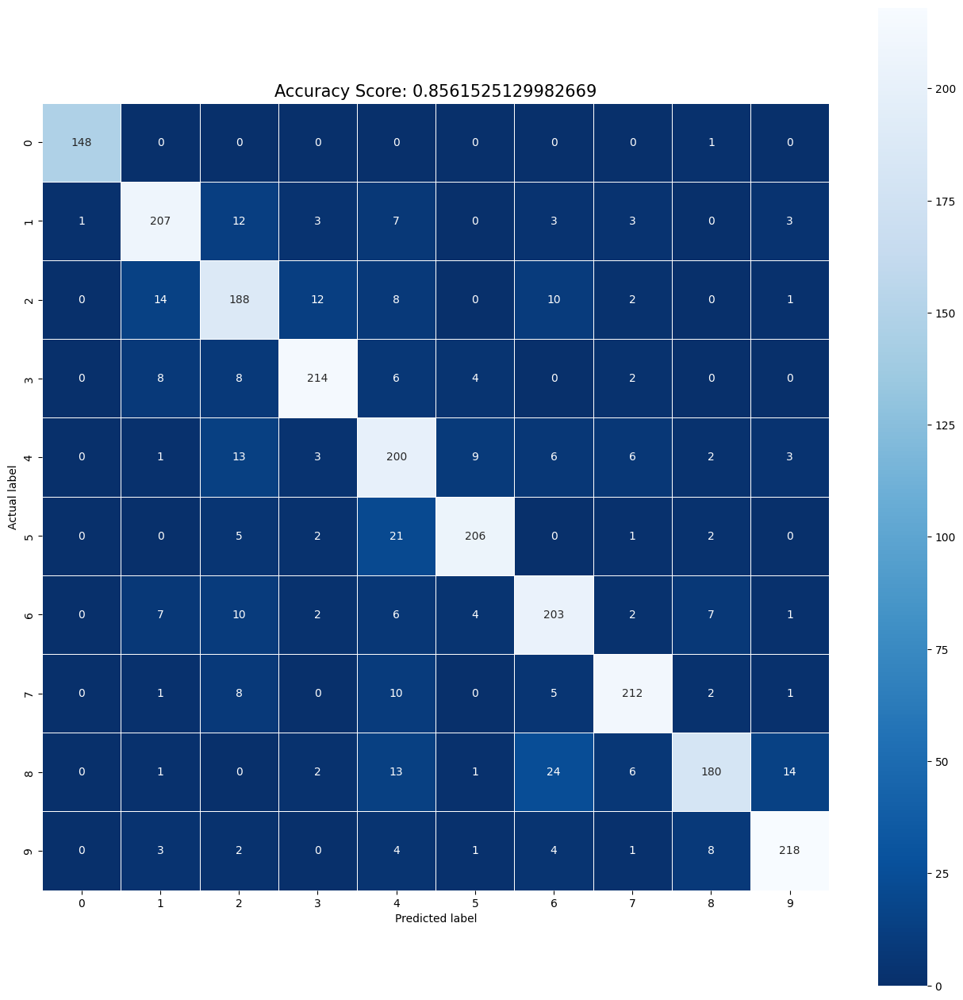

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

b. Cosine

In [ ]:
X_kNN_train, X_kNN_validation, y_kNN_train, y_kNN_validation = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_kNN_train = scaler.fit_transform(X_kNN_train)
X_kNN_validation = scaler.transform(X_kNN_validation)
best_accuracy = 0.0
best_k = None

for k in range(1,21):
    knn = KNeighborsClassifier(n_neighbors=k,metric='cosine')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=1: 0.7859618717504333
Accuracy k=2: 0.75736568457539
Accuracy k=3: 0.8024263431542461
Accuracy k=4: 0.8310225303292894
Accuracy k=5: 0.8418544194107452
Accuracy k=6: 0.8509532062391681
Accuracy k=7: 0.8513864818024264
Accuracy k=8: 0.8561525129982669
Accuracy k=9: 0.8591854419410745
Accuracy k=10: 0.8674176776429809
Accuracy k=11: 0.8635181975736569
Accuracy k=12: 0.8652512998266898
Accuracy k=13: 0.8661178509532063
Accuracy k=14: 0.8669844020797227
Accuracy k=15: 0.8747833622183708
Accuracy k=16: 0.8756499133448874
Accuracy k=17: 0.8730502599653379
Accuracy k=18: 0.8652512998266898
Accuracy k=19: 0.8678509532062392
Accuracy k=20: 0.8734835355285961


In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='cosine')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=16)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       149
           1       0.84      0.90      0.87       239
           2       0.80      0.79      0.79       235
           3       0.89      0.89      0.89       242
           4       0.76      0.86      0.80       243
           5       0.93      0.87      0.90       237
           6       0.82      0.85      0.83       242
           7       0.90      0.89      0.90       239
           8       0.90      0.75      0.82       241
           9       0.90      0.93      0.92       241

    accuracy                           0.87      2308
   macro avg       0.87      0.87      0.87      2308
weighted avg       0.87      0.87      0.87      2308



Text(0.5, 1.0, 'Accuracy Score: 0.8669844020797227')

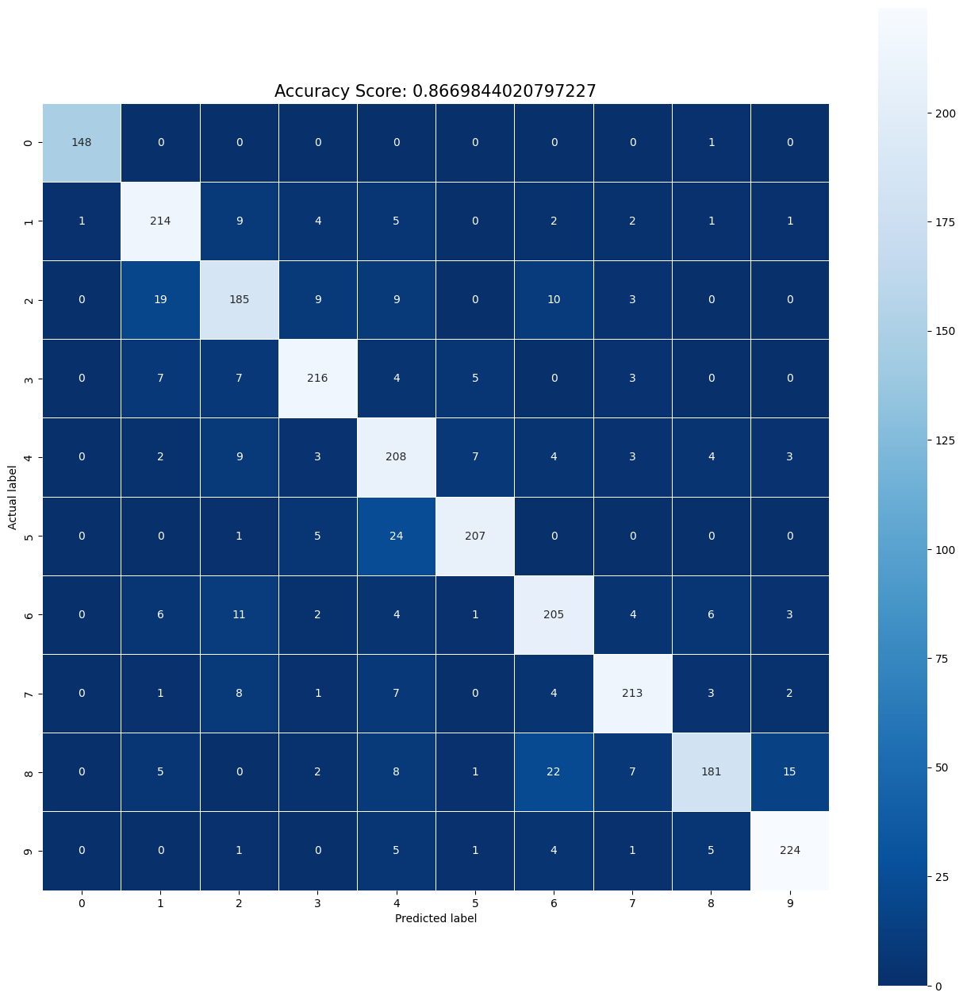

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

c. Correlation

In [ ]:
X_kNN_train, X_kNN_validation, y_kNN_train, y_kNN_validation = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_kNN_train = scaler.fit_transform(X_kNN_train)
X_kNN_validation = scaler.transform(X_kNN_validation)
best_accuracy = 0.0
best_k = None

for k in range(1,21):
    knn = KNeighborsClassifier(n_neighbors=k,metric='correlation')
    knn.fit(X_kNN_train, y_kNN_train)

    y_kNN_pred = knn.predict(X_kNN_validation)

    accuracy_knn = accuracy_score(y_kNN_validation, y_kNN_pred)
    print(f"Accuracy k={k}: {accuracy_knn}")

    if accuracy_knn > best_accuracy:
        best_accuracy = accuracy_knn
        best_k = k

Accuracy k=1: 0.7954939341421143
Accuracy k=2: 0.7677642980935875
Accuracy k=3: 0.8201906412478336
Accuracy k=4: 0.83578856152513
Accuracy k=5: 0.8440207972270364
Accuracy k=6: 0.860051993067591
Accuracy k=7: 0.865684575389948
Accuracy k=8: 0.8674176776429809
Accuracy k=9: 0.8708838821490468
Accuracy k=10: 0.8752166377816292
Accuracy k=11: 0.8708838821490468
Accuracy k=12: 0.8765164644714039
Accuracy k=13: 0.8812824956672444
Accuracy k=14: 0.8812824956672444
Accuracy k=15: 0.884315424610052
Accuracy k=16: 0.8817157712305026
Accuracy k=17: 0.8860485268630849
Accuracy k=18: 0.8856152512998267
Accuracy k=19: 0.884315424610052
Accuracy k=20: 0.8834488734835355


In [ ]:
classifier = KNeighborsClassifier(n_neighbors=best_k,metric='correlation')
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='correlation', n_neighbors=17)

In [ ]:
y_pred = classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       149
           1       0.89      0.87      0.88       239
           2       0.71      0.83      0.77       235
           3       0.89      0.93      0.91       242
           4       0.84      0.82      0.83       243
           5       0.94      0.91      0.92       237
           6       0.82      0.86      0.84       242
           7       0.95      0.89      0.92       239
           8       0.90      0.82      0.85       241
           9       0.95      0.92      0.94       241

    accuracy                           0.88      2308
   macro avg       0.89      0.88      0.88      2308
weighted avg       0.88      0.88      0.88      2308



Text(0.5, 1.0, 'Accuracy Score: 0.878682842287695')

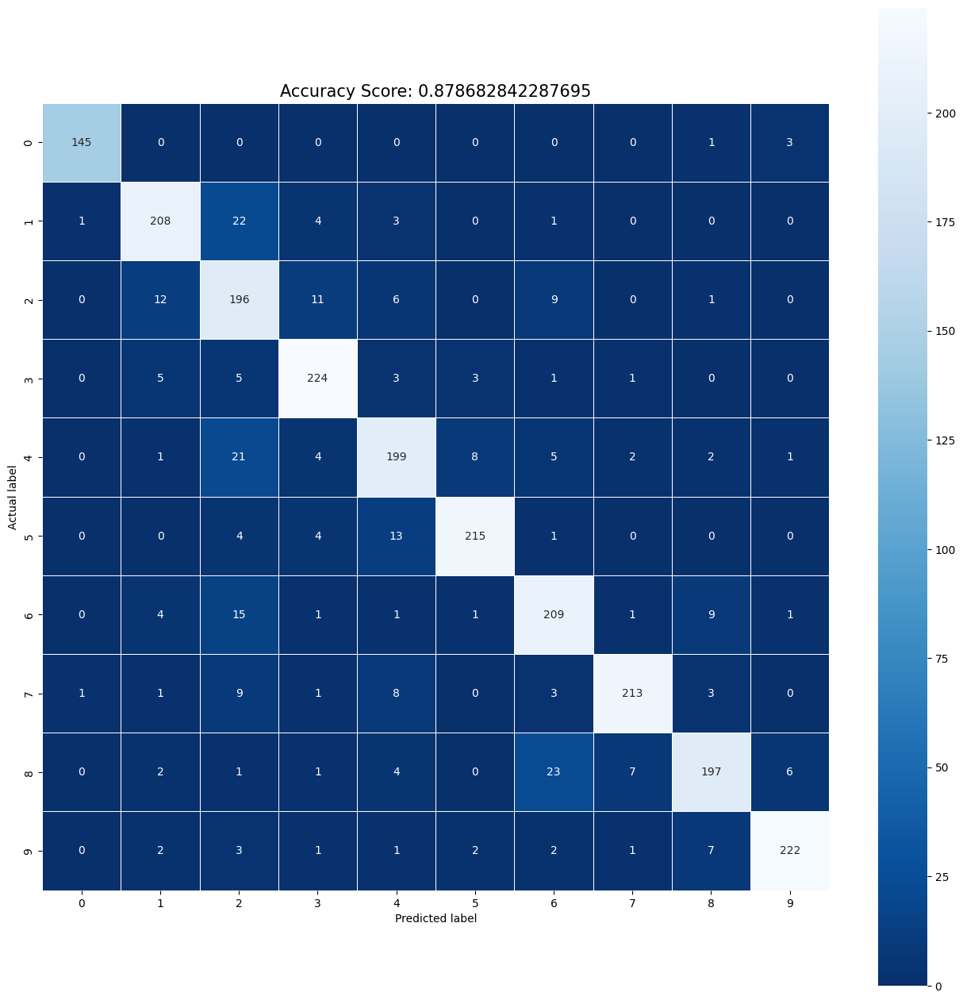

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(accuracy_score(y_test,y_pred))
plt.title(all_sample_title,size=15)

# Kiểm tra 1 bức ảnh trên internet không có trong dataset để kiểm tra có chạy đúng hay không với độ đo Correlation

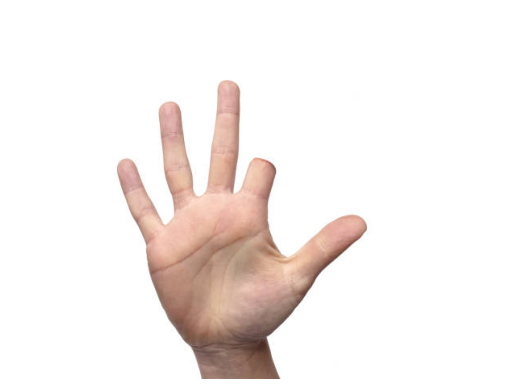

Predicted label: 5


In [ ]:
def predict_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (128, 128))
    hog_features = hog(img, pixels_per_cell=(16, 16), cells_per_block=(2, 2), visualize=False)
    hog_features = hog_features.reshape(1, -1)
    return knn.predict(hog_features)[0]
example_img_path = '/content/drive/MyDrive/CS231/5_2.jpg'
img = cv2.imread(example_img_path)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
predicted_label = predict_image(example_img_path)
print(f'Predicted label: {predicted_label}')

Kiểm tra trên tập dữ liệu tự chụp để kiểm tra có chạy đúng hay không (Ở đây sử dụng độ đo tốt nhất là Correlation với rút trích đặc trưng HOG)

In [ ]:
test_data_dir = '/content/drive/MyDrive/CS231/test'
test_images = []
test_labels = []

for subfolder in os.listdir(test_data_dir):
    subfolder_path = os.path.join('/test', subfolder)
    if not os.path.isdir(subfolder_path):
        continue

    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)

        test_images.append(image_path)
        test_labels.append(subfolder)

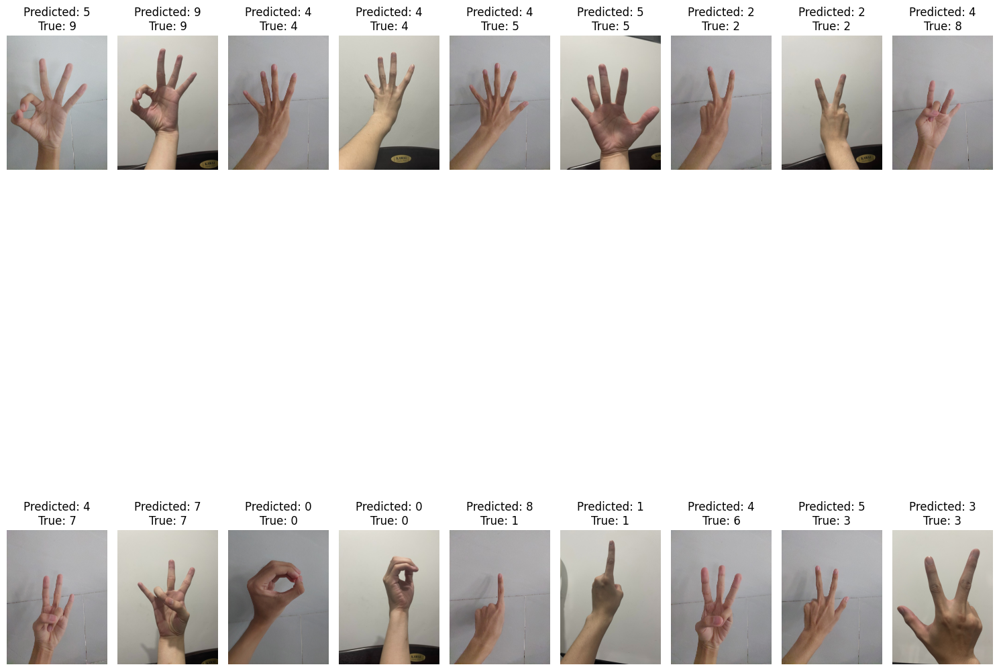

In [ ]:
num_rows = 2
num_cols = 9
plt.figure(figsize=(15, 20))
image_index = 0

for label_folder in os.listdir(test_data_dir):
    label_folder_path = os.path.join(test_data_dir, label_folder)
    if not os.path.isdir(label_folder_path):
        continue

    true_label = int(label_folder)
    for img_path in glob.glob(os.path.join(label_folder_path, '*.jpg')):
        plt.subplot(num_rows, num_cols, image_index + 1)
        processed_image = Tinh_hog(img_path)

        predicted_label = classifier.predict(processed_image.reshape(1, -1))[0]

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
        plt.title(f"Predicted: {predicted_label}\nTrue: {true_label}")
        plt.axis('off')
        image_index += 1
        if image_index >= num_rows * num_cols:
            break
    if image_index >= num_rows * num_cols:
        break

plt.tight_layout()
plt.show()

In [ ]:

# Save the trained model
joblib.dump(svm, 'best_model.h5')


['best_model.h5']

#HOG + Softmax Regression


In [ ]:
images = []
labels = []

In [ ]:
for subfolder in root_dir:
    subfolder_path = os.path.join(dir_path, subfolder)
    print(subfolder_path)
    if not os.path.isdir(subfolder_path):
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(Tinh_hog(image_path))
        labels.append(subfolder)

In [ ]:
images = np.array(images)
labels = np.array(labels)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

In [ ]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = ('Confusion Matrix')
plt.title(all_sample_title,size=15)

#Sobel + Softmax Regression

In [ ]:
for subfolder in root_dir:
    subfolder_path = os.path.join(dir_path, subfolder)
    print(subfolder_path)
    if not os.path.isdir(subfolder_path):
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(compute_sobel_features(image_path))
        labels.append(subfolder)

In [ ]:
images = np.array(images)
labels = np.array(labels)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=22520263, shuffle=True, stratify=labels)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

In [ ]:
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

In [ ]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(16,16))
sns.heatmap(cm,annot=True, fmt='.0f', linewidths=.5, square=True,cmap='Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = ('Confusion Matrix')
plt.title(all_sample_title,size=15)

# Test với 100 ảnh random từ tập test


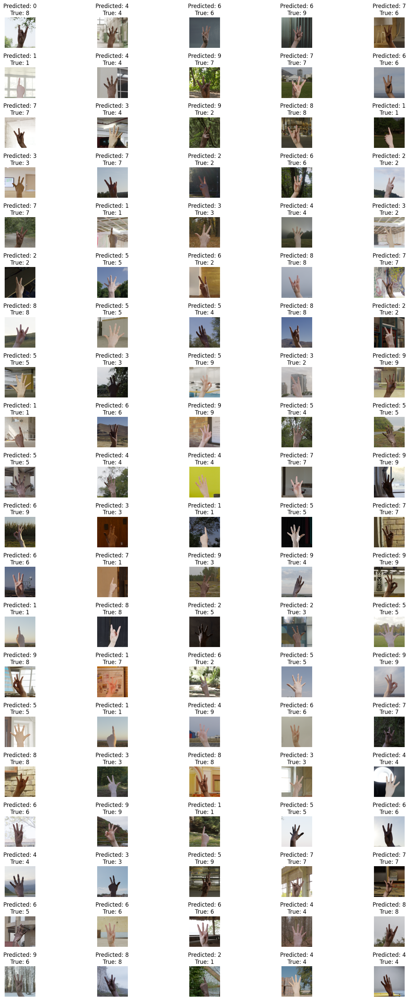

In [ ]:

# Load the trained SVM model
model = joblib.load('best_model.h5')

# Define the directory path containing the test dataset
dir_path = '/content/drive/MyDrive/DoAnThiGiac1/test'

# Load the test dataset
images = []
labels = []

# Load images and labels from the test directory
for subfolder in os.listdir(dir_path):
    subfolder_path = os.path.join(dir_path, subfolder)
    if not os.path.isdir(subfolder_path) or subfolder == 'test':
        continue
    for image_filename in os.listdir(subfolder_path):
        image_path = os.path.join(subfolder_path, image_filename)
        images.append(image_path)
        labels.append(subfolder)

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Select 100 random test images
test_indices = np.random.choice(len(images), size=100, replace=False)
test_images = images[test_indices]
test_labels = labels[test_indices]

def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to a fixed size
    img_resized = cv2.resize(img, (128, 128))  # Resize to match the expected input size
    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(img_resized, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(img_resized, cv2.CV_64F, 0, 1, ksize=5)
    gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    return gradient_mag.flatten()



# Initialize lists to store incorrectly predicted images
incorrect_images = []
incorrect_labels = []
predicted_labels = []

# Plotting 100 test images with a layout of 20 rows and 5 columns
num_rows = 20
num_cols = 5
plt.figure(figsize=(15, 30))

for i in range(100):
    plt.subplot(num_rows, num_cols, i+1)
    img_path = test_images[i]
    true_label = test_labels[i]

    # Preprocess the image
    processed_image = preprocess_image(img_path)

    # Predict label using the trained model
    predicted_label = model.predict([processed_image])[0]

    # Store the predicted label
    predicted_labels.append(predicted_label)

    # Load and display the image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f"Predicted: {predicted_label}\nTrue: {true_label}")
    plt.axis('off')

    # Check if prediction is incorrect
    if predicted_label != true_label:
        incorrect_images.append(img_rgb)
        incorrect_labels.append(true_label)

plt.tight_layout()
plt.show()



# Test với số điện thoại với các ảnh đã được chuẩn bị ở mục SDT

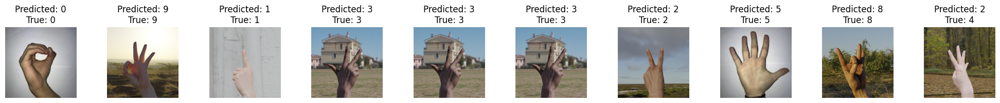

Predicted phone number: 0913332582


In [ ]:
import os
import cv2
import joblib
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted

# Load the trained SVM model
model = joblib.load('best_model.h5')

# Define the directory path containing the SDT dataset
dir_path = '/content/drive/MyDrive/DoAnThiGiac1/SDT'

# The desired order of directories corresponding to the phone number
desired_order = ['0', '9', '1', '3', '3', '3', '2', '5', '8','4']

# Initialize lists to store images and labels
images = []
labels = []

# Loop through desired order and process images
for digit in desired_order:
    subdir_path = os.path.join(dir_path, digit)
    if os.path.isdir(subdir_path):
        # Get list of image files in subdir_path and sort them naturally
        image_files = natsorted([f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f))])
        for image_filename in image_files:
            image_path = os.path.join(subdir_path, image_filename)
            if os.path.exists(image_path):
                images.append(image_path)
                labels.append(digit)
            else:
                print(f"File does not exist: {image_path}")

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error reading image {image_path}")
        return None
    # Resize the image to a fixed size
    img_resized = cv2.resize(img, (128, 128))  # Resize to match the expected input size
    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(img_resized, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(img_resized, cv2.CV_64F, 0, 1, ksize=5)
    gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    return gradient_mag.flatten()

# Initialize lists to store incorrectly predicted images
incorrect_images = []
incorrect_labels = []
predicted_labels = []

# Plotting all test images with a layout of 1 row and num_images columns
num_images = len(images)
plt.figure(figsize=(num_images * 2, 2))

for i in range(num_images):
    plt.subplot(1, num_images, i + 1)
    img_path = images[i]
    true_label = labels[i]

    # Preprocess the image
    processed_image = preprocess_image(img_path)
    if processed_image is None:
        continue

    # Predict label using the trained model
    try:
        predicted_label = model.predict([processed_image])[0]
    except Exception as e:
        print(f"Error predicting label for image {img_path}: {e}")
        continue

    # Store the predicted label
    predicted_labels.append(predicted_label)

    # Load and display the image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f"Predicted: {predicted_label}\nTrue: {true_label}")
    plt.axis('off')

    # Check if prediction is incorrect
    if predicted_label != true_label:
        incorrect_images.append(img_rgb)
        incorrect_labels.append(true_label)

plt.tight_layout()
plt.show()

# Print out the predicted phone number
predicted_phone_number = ''.join(predicted_labels)
print(f"Predicted phone number: {predicted_phone_number}")


# Test với một số điện thoại tự chụp bởi tay thành viên trong nhóm

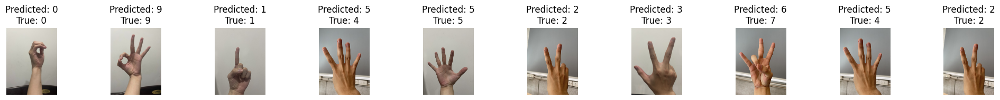

Predicted phone number: 0915523652


In [ ]:
import os
import cv2
import joblib
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted

# Load the trained SVM model
model = joblib.load('best_model.h5')

# Define the directory path containing the SDT dataset
dir_path = '/content/drive/MyDrive/DoAnThiGiac1/SDTQD'

# The desired order of directories corresponding to the phone number
desired_order = ['0', '9', '1', '4', '5', '2', '3', '7', '4', '2']

# Initialize lists to store images and labels
images = []
labels = []

# Loop through desired order and process images
for digit in desired_order:
    subdir_path = os.path.join(dir_path, digit)
    if os.path.isdir(subdir_path):
        # Get list of image files in subdir_path and sort them naturally
        image_files = natsorted([f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f))])
        for image_filename in image_files:
            image_path = os.path.join(subdir_path, image_filename)
            if os.path.exists(image_path):
                images.append(image_path)
                labels.append(digit)
            else:
                print(f"File does not exist: {image_path}")

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error reading image {image_path}")
        return None
    # Resize the image to a fixed size
    img_resized = cv2.resize(img, (128, 128))  # Resize to match the expected input size
    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(img_resized, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(img_resized, cv2.CV_64F, 0, 1, ksize=5)
    gradient_mag = np.sqrt(sobel_x**2 + sobel_y**2)
    return gradient_mag.flatten()

# Initialize lists to store incorrectly predicted images
incorrect_images = []
incorrect_labels = []
predicted_labels = []

# Plotting all test images with a layout of 1 row and num_images columns
num_images = len(images)
plt.figure(figsize=(num_images * 2, 2))

for i in range(num_images):
    plt.subplot(1, num_images, i + 1)
    img_path = images[i]
    true_label = labels[i]

    # Preprocess the image
    processed_image = preprocess_image(img_path)
    if processed_image is None:
        continue

    # Predict label using the trained model
    try:
        predicted_label = model.predict([processed_image])[0]
    except Exception as e:
        print(f"Error predicting label for image {img_path}: {e}")
        continue

    # Store the predicted label
    predicted_labels.append(predicted_label)

    # Load and display the image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f"Predicted: {predicted_label}\nTrue: {true_label}")
    plt.axis('off')

    # Check if prediction is incorrect
    if predicted_label != true_label:
        incorrect_images.append(img_rgb)
        incorrect_labels.append(true_label)

plt.tight_layout()
plt.show()

# Print out the predicted phone number
predicted_phone_number = ''.join(predicted_labels)
print(f"Predicted phone number: {predicted_phone_number}")
